# 마스킹

In [4]:
import cv2
import numpy as np
from sklearn.svm import OneClassSVM

video_path = "D:\\kys\\public\\old_scada.mp4"
cap = cv2.VideoCapture(video_path)


def mask_time(frame):
    frame[54:94,433:445] = 0 # 검은색,  cv2에서는 y 와 x 가 거꾸로 
    frame[298:315,122:310] = 0 # 검은색, cv2에서는 y 와 x 가 거꾸로 
    return frame

def extract_feature(frame):
    frame = mask_time(frame)
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY) # 그레이스케일 , 성능을 위해서 중요, 체널 1개
    resized = cv2.resize(gray,(32, 32)) # 크기축소 (전체구조를 요약) 320 X 446 -> 32 X 32 로 바꿔서 속도향상, 메모리 절감
    feature = resized.flatten() / 255.0 # 정규화 백터화
    return feature

train_feature = []
test_feature = []
frame_idx = 0
while True:
    ret, frame = cap.read()
    if not ret: break

    feature = extract_feature(frame)

    if frame_idx <= 828:
        train_feature.append(feature)
    elif 828 < frame_idx < 1337:
        test_feature.append(feature)     
    frame_idx += 1 
cap.release()
X_train = np.array(train_feature)
X_test = np.array(test_feature)

# One - Class SVM 학습
ocsvm = OneClassSVM(kernel="rbf", gamma="auto", nu=0.05)
# linear , poly, sigmoid , 
# rbf: 비선형, 가우시안, 대부분 사용, 기본값
# gamma="auto" 없애면 기본값 'scale'
# nu = 이상치 값 (0 ~ 1)

# 훈련
ocsvm.fit(X_train) 

# 이상 탐지
pred = ocsvm.predict(X_test) # 1:정상 , -1: 비정상
abnormal_idx = np.where(pred==-1)[0] + 828
print("NG(공정 B의 의심)프레임:", abnormal_idx, len(abnormal_idx) )


NG(공정 B의 의심)프레임: [ 932  933  934  935  965  966  967  968  998  999 1000 1041 1042 1043
 1054 1055 1056 1064 1065 1066 1110 1111 1112 1113 1114 1115 1116 1117
 1118 1129 1130 1131 1132 1139 1152 1179 1180 1181 1198 1199 1200 1201
 1205 1206 1207 1215 1216 1217 1218 1219 1220 1225 1226 1227 1228 1229
 1230 1235 1236 1237 1241 1242 1243 1244 1245 1246 1247 1248 1249 1250
 1251 1252 1253 1254 1255 1256 1257 1258 1259 1260 1261 1262 1263 1264
 1265 1266 1267 1268 1269 1270 1271 1272 1273 1274 1275 1276 1277 1278
 1279 1280] 100


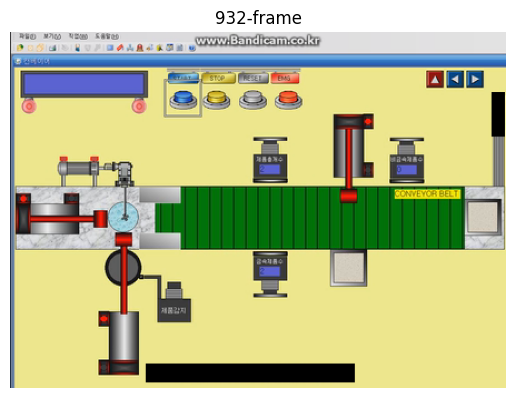

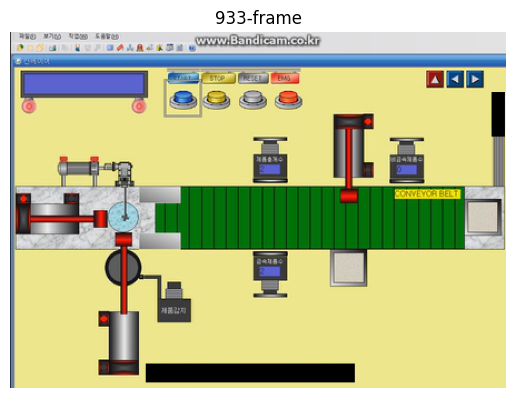

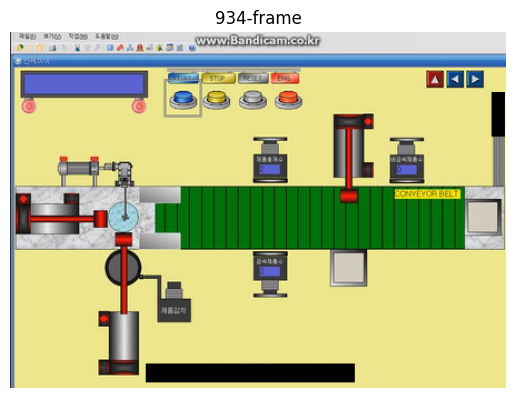

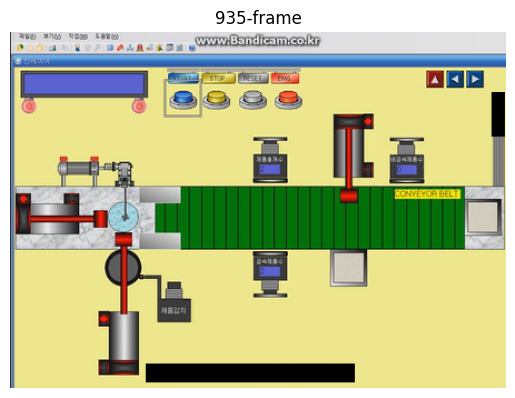

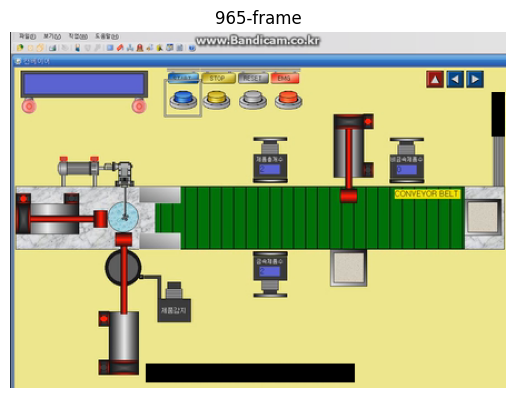

...

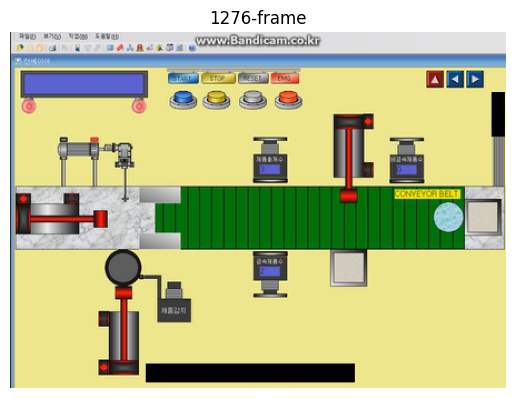

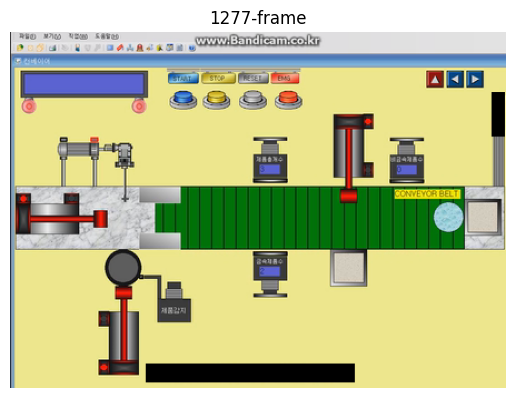

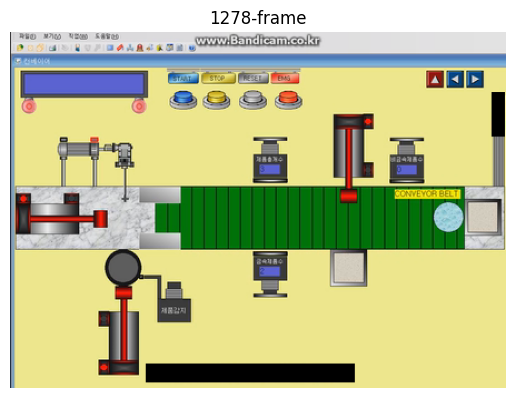

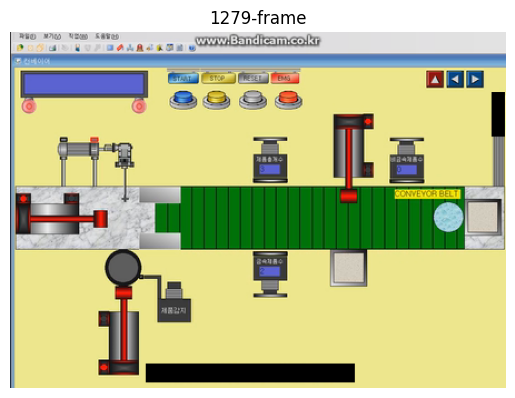

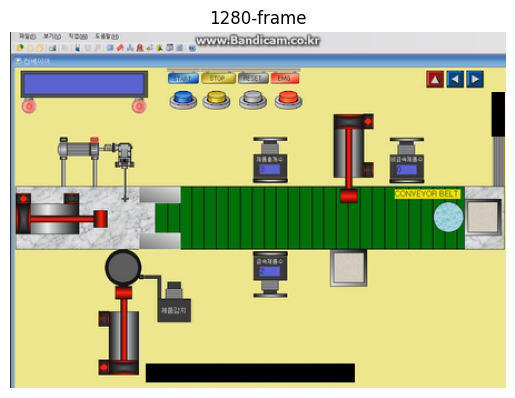

In [5]:
# 특정 프레임 보기
import matplotlib.pyplot as plt
cap = cv2.VideoCapture(video_path)
for position in abnormal_idx:
    cap.set(cv2.CAP_PROP_POS_FRAMES, position)
    _ , frame = cap.read()
    frame = mask_time(frame)
    rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    plt.imshow(rgb)
    plt.title(f"{position}-frame")
    plt.axis("off")
    plt.show()
cap.release()